## 1. Introduction

### 1.1 Problem Statement
<br>
<div style="text-align: justify">
Given that cell phone industry is one of the fastest growing sectors in the larger communications industry and is highly competitve, it is necessary for cell phone companies to understand the needs and wants of their customers in order to provide them with the best product/service. Therefore, by analyzing customers cell phone reviews using natural langauge processing (NLP) analysis such as topic modelling and sentiment analsis, this will help companies to gain insights of their customers more in depth, strategize and make better informed decisions.
</div>

### 1.2 Goals of Project
1. Learn how to pre-process data using text mining techniques like tokenization, stop word removal, lemmatization and others before applying NLP analysis
2. Learn how to utilize topic modelling to discover a set of topics that best describe the reviews/most frequently discussed aspects of cell phones and sort them by different topics
3. Learn how to leverage on sentiment analysis to help cell phone brands to estimate how customers feel about a particular brand regarding the quality of products
4. Provide key takeaways for each stages of text mining based on the presented facts and observations gathered

### 1.3 Background of Dataset
<br>
<div style="text-align: justify">
This dataset contains information about the cell phones (brand, price etc.) as well as reviews and ratings given by the end-users. It scoped on 10 key brands - ASUS, Apple, Google, HuaWei, Motorola, Nokia, OnePlus, Samsung, Sony, and Xiaomi. Furthermore, it contains two csv files and is retrieved from Kaggle. <br>

1. Items.csv - contains scraped and retrieved items from Amazon.com search results using generated URL and specific query string to search only specific brands and has minimal 1 star review [10 columns] <br><br>
    
2. Reviews.csv - contains reviews for previously retrieved items at items.csv file and with different columns [8 columns] <br>


<b> Data Source: </b> https://www.kaggle.com/grikomsn/amazon-cell-phones-reviews?select=20191226-reviews.csv
</div>

## 2. Getting Started

### 2.1 Import required libraries
<br>
<div style="text-align: justify">
Before we proceed with data preprocessing, topic modelling as well as sentiment analysis, the following are the libraries and external API that are required.
</div>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#### 2.1.1 Dictionary and Auto English Correction
<br>
<div style="text-align: justify">
Need to install pyenchant and pyspellchecker to check the spelling of words and suggest corrections for words that are misspelled.
</div>

In [2]:
# for dictionary and auto english correction
!apt install -qq enchant
!pip install pyenchant
import enchant
d = enchant.Dict("en_US")

!pip install pyspellchecker 
from spellchecker import SpellChecker
spell = SpellChecker()

'apt' is not recognized as an internal or external command,
operable program or batch file.


#### 2.1.2 For Topic Modelling
<br>
<div style="text-align: justify">
As part of data pre-processing, packages like punkt, averaged_perceptron_tagger, stopwords and wordnet are required to help us tokenize, do POS tagging as well as remove stopwords. <br>
    
Other packages needed for topic modelling are included in its subsequent respective section.
</div>

In [3]:
#for topic analysis
import nltk
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')
nltk.download('wordnet')  
import string
from nltk import word_tokenize, pos_tag
from nltk.corpus import stopwords
stopwords = stopwords.words('english')

[nltk_data] Downloading package punkt to C:\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


#### 2.1.3 For Sentiment Analysis
<br>
<div style="text-align: justify">
For sentiment analysis, packages such as azure text analytics and textblob will be used to process the textual data and uncover sentiment analysis. Moreover, other packages on visualization/graphs like plotly and cufflinks will be included as well.
</div>

In [4]:
# azure text analytics api
!pip install azure-ai-textanalytics

# WordCloud
!pip install WordCloud

#textblob
!pip install textblob      
import textblob            
from textblob import TextBlob

# plotly graph
!pip install plotly
!pip install cufflinks
from plotly.offline import iplot
import plotly.graph_objects as go

### 2.2 Read Raw Files
<br>
<div style="text-align: justify">
We will be reading two of the csv files that we have retrieved from Kaggle. Both items.csv and reviews.csv contain 10 columns and 8 columns respectively.
</div>

#### 2.2.1 Items.csv

In [ ]:
item = pd.read_csv('raw-items.csv')
item

,asin,brand,title,url,image,rating,reviewUrl,totalReviews,price,originalPrice
0,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.00
1,B0009N5L7K,Motorola,Motorola I265 phone,https://www.amazon.com/Motorola-i265-I265-phon...,https://m.media-amazon.com/images/I/419WBAVDAR...,3.0,https://www.amazon.com/product-reviews/B0009N5L7K,7,49.95,0.00
2,B000SKTZ0S,Motorola,MOTOROLA C168i AT&T CINGULAR PREPAID GOPHONE C...,https://www.amazon.com/MOTOROLA-C168i-CINGULAR...,https://m.media-amazon.com/images/I/71b+q3ydkI...,2.7,https://www.amazon.com/product-reviews/B000SKTZ0S,22,99.99,0.00
3,B001AO4OUC,Motorola,Motorola i335 Cell Phone Boost Mobile,https://www.amazon.com/Motorola-i335-Phone-Boo...,https://m.media-amazon.com/images/I/710UO8gdT+...,3.3,https://www.amazon.com/product-reviews/B001AO4OUC,21,0.00,0.00
4,B001DCJAJG,Motorola,Motorola V365 no contract cellular phone AT&T,https://www.amazon.com/Motorola-V365-contract-...,https://m.media-amazon.com/images/I/61LYNCVrrK...,3.1,https://www.amazon.com/product-reviews/B001DCJAJG,12,149.99,0.00
...,...,...,...,...,...,...,...,...,...,...
715,B07ZPKZSSC,Apple,"Apple iPhone 11 Pro, 64GB, Fully Unlocked - Sp...",https://www.amazon.com/Apple-iPhone-64GB-Fully...,https://m.media-amazon.com/images/I/41wDuEW9iZ...,1.0,https://www.amazon.com/product-reviews/B07ZPKZSSC,1,949.00,0.00
716,B07ZQSGP53,Xiaomi,"Xiaomi Redmi Note 8, 32GB/3GB RAM 6.3"" FHD+ Di...",https://www.amazon.com/Xiaomi-Display-Snapdrag...,https://m.media-amazon.com/images/I/41foh4FKHE...,4.6,https://www.amazon.com/product-reviews/B07ZQSGP53,3,150.96,0.00
717,B081H6STQQ,Sony,Sony Xperia 1 Unlocked Smartphone and WH1000XM...,https://www.amazon.com/Sony-Smartphone-WH1000X...,https://m.media-amazon.com/images/I/51zZTAXZTP...,4.5,https://www.amazon.com/product-reviews/B081H6STQQ,70,948.00,0.00
718,B081TJFVCJ,Apple,"Apple iPhone X, 64GB, Gray - Fully Unlocked (R...",https://www.amazon.com/Apple-iPhone-64GB-Gray-...,https://m.media-amazon.com/images/I/71yMgOenT5...,5.0,https://www.amazon.com/product-reviews/B081TJFVCJ,1,478.97,0.00


#### 2.2.2 Reviews.csv

In [ ]:
review = pd.read_csv('raw-reviews.csv')
review

,asin,name,rating,date,verified,title,body,helpfulVotes
0,B0000SX2UC,Janet,3,"October 11, 2005",False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,1.0
1,B0000SX2UC,Luke Wyatt,1,"January 7, 2004",False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,17.0
2,B0000SX2UC,Brooke,5,"December 30, 2003",False,Love This Phone,"This is a great, reliable phone. I also purcha...",5.0
3,B0000SX2UC,amy m. teague,3,"March 18, 2004",False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",1.0
4,B0000SX2UC,tristazbimmer,4,"August 28, 2005",False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,1.0
...,...,...,...,...,...,...,...,...
67981,B081H6STQQ,jande,5,"August 16, 2019",False,"Awesome Phone, but finger scanner is a big mis...",I love the camera on this phone. The screen is...,1.0
67982,B081H6STQQ,2cool4u,5,"September 14, 2019",False,Simply Amazing!,I've been an Xperia user for several years and...,1.0
67983,B081H6STQQ,simon,5,"July 14, 2019",False,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin,NaN
67984,B081TJFVCJ,Tobiasz Jedrysiak,5,"December 24, 2019",True,Phone is like new,Product looks and works like new. Very much re...,NaN


### 2.3 Merge Raw Files

In [ ]:
#merge both file together
df = pd.merge(item, review, how='right', on='asin')
df

,asin,brand,title_x,url,image,rating_x,reviewUrl,totalReviews,price,originalPrice,name,rating_y,date,verified,title_y,body,helpfulVotes
0,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.00,Janet,3,"October 11, 2005",False,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...,1.0
1,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.00,Luke Wyatt,1,"January 7, 2004",False,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...,17.0
2,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.00,Brooke,5,"December 30, 2003",False,Love This Phone,"This is a great, reliable phone. I also purcha...",5.0
3,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.00,amy m. teague,3,"March 18, 2004",False,"Love the Phone, BUT...!","I love the phone and all, because I really did...",1.0
4,B0000SX2UC,NaN,Dual-Band / Tri-Mode Sprint PCS Phone w/ Voice...,https://www.amazon.com/Dual-Band-Tri-Mode-Acti...,https://m.media-amazon.com/images/I/2143EBQ210...,3.0,https://www.amazon.com/product-reviews/B0000SX2UC,14,0.00,0.00,tristazbimmer,4,"August 28, 2005",False,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67981,B081H6STQQ,Sony,Sony Xperia 1 Unlocked Smartphone and WH1000XM...,https://www.amazon.com/Sony-Smartphone-WH1000X...,https://m.media-amazon.com/images/I/51zZTAXZTP...,4.5,https://www.amazon.com/product-reviews/B081H6STQQ,70,948.00,0.00,jande,5,"August 16, 2019",False,"Awesome Phone, but finger scanner is a big mis...",I love the camera on this phone. The screen is...,1.0
67982,B081H6STQQ,Sony,Sony Xperia 1 Unlocked Smartphone and WH1000XM...,https://www.amazon.com/Sony-Smartphone-WH1000X...,https://m.media-amazon.com/images/I/51zZTAXZTP...,4.5,https://www.amazon.com/product-reviews/B081H6STQQ,70,948.00,0.00,2cool4u,5,"September 14, 2019",False,Simply Amazing!,I've been an Xperia user for several years and...,1.0
67983,B081H6STQQ,Sony,Sony Xperia 1 Unlocked Smartphone and WH1000XM...,https://www.amazon.com/Sony-Smartphone-WH1000X...,https://m.media-amazon.com/images/I/51zZTAXZTP...,4.5,https://www.amazon.com/product-reviews/B081H6STQQ,70,948.00,0.00,simon,5,"July 14, 2019",False,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin,NaN
67984,B081TJFVCJ,Apple,"Apple iPhone X, 64GB, Gray - Fully Unlocked (R...",https://www.amazon.com/Apple-iPhone-64GB-Gray-...,https://m.media-amazon.com/images/I/71yMgOenT5...,5.0,https://www.amazon.com/product-reviews/B081TJFVCJ,1,478.97,0.00,Tobiasz Jedrysiak,5,"December 24, 2019",True,Phone is like new,Product looks and works like new. Very much re...,NaN


## 3. Text Preprocessing

### 3.1 Drop Irrelevant Columns
<br>
<div style="text-align: justify">
Considering that some of the columns are irrelevant and will not bring any value to our analysis, we decided to drop a total of 10 columns - title_x, url, image, reviewUrl, price, originalPrice, name, date, verified and helpfulVotes.
</div>

In [ ]:
# drop the unnecessary columnn
df = df[['asin', 'brand', 'rating_x', 'totalReviews', 'rating_y', 'title_y', 'body']]
df

,asin,brand,rating_x,totalReviews,rating_y,title_y,body
0,B0000SX2UC,NaN,3.0,14,3,"Def not best, but not worst",I had the Samsung A600 for awhile which is abs...
1,B0000SX2UC,NaN,3.0,14,1,Text Messaging Doesn't Work,Due to a software issue between Nokia and Spri...
2,B0000SX2UC,NaN,3.0,14,5,Love This Phone,"This is a great, reliable phone. I also purcha..."
3,B0000SX2UC,NaN,3.0,14,3,"Love the Phone, BUT...!","I love the phone and all, because I really did..."
4,B0000SX2UC,NaN,3.0,14,4,"Great phone service and options, lousy case!",The phone has been great for every purpose it ...
...,...,...,...,...,...,...,...
67981,B081H6STQQ,Sony,4.5,70,5,"Awesome Phone, but finger scanner is a big mis...",I love the camera on this phone. The screen is...
67982,B081H6STQQ,Sony,4.5,70,5,Simply Amazing!,I've been an Xperia user for several years and...
67983,B081H6STQQ,Sony,4.5,70,5,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin
67984,B081TJFVCJ,Apple,5.0,1,5,Phone is like new,Product looks and works like new. Very much re...


### 3.2 Check for Missing Value
<br>
<div style="text-align: justify">
Upon checking for missing values, some of the columns such as brand, title_y and body have missing values. Considering that we are dealing with large datasets with approximate 68K reviews, all these missing values will be dropped since they wouldn't have much influence.
</div>

In [ ]:
df.isnull().sum()

asin              0
brand           200
rating_x          0
totalReviews      0
rating_y          0
title_y          14
body             21
dtype: int64

### 3.3 Drop Missing Value
<br>
<div style="text-align: justify">
Missing values in brand, title_y and body columns will be dropped.
</div>

In [ ]:
#drop NA 
df.dropna(inplace=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df.isnull().sum()

asin            0
brand           0
rating_x        0
totalReviews    0
rating_y        0
title_y         0
body            0
dtype: int64

### 3.4 Rename Column to Meaningful Name
<br>
<div style="text-align: justify">
In order to enable users to understand what all of the columns are about, it is import to provide columns with meaningful names for more intuitive understanding of the variables. Therefore, some of the columns will be renamed.
</div>

In [ ]:
#rename the column
df.rename(columns={"asin": "model_no", "rating_x": "avg_rating", "totalReviews": "total_review", "rating_y": "cust_rating", "title_y": "review_title", "body": "review"}, inplace=True)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
df

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review
14,B0009N5L7K,Motorola,3.0,7,1,Stupid phone,DON'T BUY OUT OF SERVICE
15,B0009N5L7K,Motorola,3.0,7,4,Exellent Service,I have been with nextel for nearly a year now ...
16,B0009N5L7K,Motorola,3.0,7,5,I love it,"I just got it and have to say its easy to use,..."
17,B0009N5L7K,Motorola,3.0,7,1,Phones locked,1 star because the phones locked so I have to ...
18,B0009N5L7K,Motorola,3.0,7,5,Excellent product,The product has been very good. I had used thi...
...,...,...,...,...,...,...,...
67981,B081H6STQQ,Sony,4.5,70,5,"Awesome Phone, but finger scanner is a big mis...",I love the camera on this phone. The screen is...
67982,B081H6STQQ,Sony,4.5,70,5,Simply Amazing!,I've been an Xperia user for several years and...
67983,B081H6STQQ,Sony,4.5,70,5,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin
67984,B081TJFVCJ,Apple,5.0,1,5,Phone is like new,Product looks and works like new. Very much re...


### 3.5 Remove Non-English Word
<br>
<div style="text-align: justify">
To simplify the analysis, non-english reviews were removed from the dataset and misspellings under the "review" column were corrected. <br>

Please take note that due to pakages limitations, not all reviews with foreign language(s) were detectable. Hence, some were not removed during the preprocessing.
</div>

In [ ]:
#converting to lower case
df['review_title'] = df['review_title'].str.lower()
df['review'] = df['review'].str.lower()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
def removeNonEnglish(sentence):
  sentence=sentence.split(" ")
  output=[]
  brandName=['apple','xiaomi','samsung','motorola','nokia','sony','sony','asus','oneplus','huawei']
  for word in sentence:
    if word not in brandName:
      # word=spell.correction(word)
      if d.check(word):
        output.append(word)
      else:
        word=spell.correction(word)
        if d.check(word):
          output.append(word)
  return ' '.join(output)

<br>
<div style="text-align: justify">
Upon running the following function that is meant to remove the non-english words, we realised that the estimated runtime is 1 day on our own local computer. Therefore, we decided to export it to excel and did our feature engineering on this feature via excel for ease of presentation. <br>
    
It will be saved to a new csv file called "processed-reviews.xlsx" with an additional column "reviewedited" that consists all the reviews after removing the non-english words if necessary.
</div>

In [ ]:
# df['reviewedited']=df['review'].apply(removeNonEnglish)
# df.to_excel('processed-reviews.xlsx', index=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df = pd.read_excel('processed-reviews.xlsx')
df

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review,reviewedited
0,B0009N5L7K,Motorola,3.0,7,1,stupid phone,don't buy out of service,don't buy out of service
1,B0009N5L7K,Motorola,3.0,7,4,exellent service,i have been with nextel for nearly a year now ...,i have been with for nearly a year now i start...
2,B0009N5L7K,Motorola,3.0,7,5,i love it,"i just got it and have to say its easy to use,...",i just got it and have to say its easy to used...
3,B0009N5L7K,Motorola,3.0,7,1,phones locked,1 star because the phones locked so i have to ...,1 star because the phones locked so i have to ...
4,B0009N5L7K,Motorola,3.0,7,5,excellent product,the product has been very good. i had used thi...,the product has been very good. i had used thi...
...,...,...,...,...,...,...,...,...
67751,B081H6STQQ,Sony,4.5,70,5,"awesome phone, but finger scanner is a big mis...",i love the camera on this phone. the screen is...,i love the camera on this phone. the screen is...
67752,B081H6STQQ,Sony,4.5,70,5,simply amazing!,i've been an xperia user for several years and...,been an opera user for several years and i hav...
67753,B081H6STQQ,Sony,4.5,70,5,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin,buy one more for my cousin
67754,B081TJFVCJ,Apple,5.0,1,5,phone is like new,product looks and works like new. very much re...,product looks and works like new. very much re...


### 3.6 Check for Missing Value [Second Round]
<br>
<div style="text-align: justify">
After removing all the non-english words, it is important for us to do data pre-processing again and to check if there's any missing values. We found out that columns like review_title and reviewedited have missing values. This is so because the original reviews given were in foreign langauge(s) previously, which had already been removed and corrected accordingly.
</div>

In [ ]:
df.isnull().sum()

model_no          0
brand             0
avg_rating        0
total_review      0
cust_rating       0
review_title      7
review            0
reviewedited    660
dtype: int64

### 3.7 Drop Missing Value [Second Round]
<br>
<div style="text-align: justify">
Similary to the previous section, missing values in these columns will be removed as well.
</div>

In [ ]:
#drop NA fills
df.dropna(inplace=True)

In [ ]:
df.isnull().sum()

model_no        0
brand           0
avg_rating      0
total_review    0
cust_rating     0
review_title    0
review          0
reviewedited    0
dtype: int64

In [ ]:
df.drop(columns=['review'], inplace=True)
df.rename(columns={"reviewedited": "review"}, inplace=True)
df

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review
0,B0009N5L7K,Motorola,3.0,7,1,stupid phone,don't buy out of service
1,B0009N5L7K,Motorola,3.0,7,4,exellent service,i have been with for nearly a year now i start...
2,B0009N5L7K,Motorola,3.0,7,5,i love it,i just got it and have to say its easy to used...
3,B0009N5L7K,Motorola,3.0,7,1,phones locked,1 star because the phones locked so i have to ...
4,B0009N5L7K,Motorola,3.0,7,5,excellent product,the product has been very good. i had used thi...
...,...,...,...,...,...,...,...
67751,B081H6STQQ,Sony,4.5,70,5,"awesome phone, but finger scanner is a big mis...",i love the camera on this phone. the screen is...
67752,B081H6STQQ,Sony,4.5,70,5,simply amazing!,been an opera user for several years and i hav...
67753,B081H6STQQ,Sony,4.5,70,5,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin
67754,B081TJFVCJ,Apple,5.0,1,5,phone is like new,product looks and works like new. very much re...


In [ ]:
df.to_csv('processed-final.csv', index=False)

## 4. Topic Modelling
<br>
<div style="text-align: justify">
For topic modelling, it helps to discover the most frequently discussed topics by sifting through large amount of textual information to understand patterns. In order to extract the meaning from the documents, we will be classifying each review into different topics to determine areas in which companies can work on. <br>

<b>Assumption: </b> documents belonging to the same topic use similar words and that every document is composed of a mixture of topics such as hardware, service and other more. In addition, every word has a probability belonging to a certain topic.
</div>

In [ ]:
# import back for convenience 
df = pd.read_csv('processed-final.csv')
df

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review
0,B0009N5L7K,Motorola,3.0,7,1,stupid phone,don't buy out of service
1,B0009N5L7K,Motorola,3.0,7,4,exellent service,i have been with for nearly a year now i start...
2,B0009N5L7K,Motorola,3.0,7,5,i love it,i just got it and have to say its easy to used...
3,B0009N5L7K,Motorola,3.0,7,1,phones locked,1 star because the phones locked so i have to ...
4,B0009N5L7K,Motorola,3.0,7,5,excellent product,the product has been very good. i had used thi...
...,...,...,...,...,...,...,...
67085,B081H6STQQ,Sony,4.5,70,5,"awesome phone, but finger scanner is a big mis...",i love the camera on this phone. the screen is...
67086,B081H6STQQ,Sony,4.5,70,5,simply amazing!,been an opera user for several years and i hav...
67087,B081H6STQQ,Sony,4.5,70,5,"great phon3, but many bugs need to fix. still ...",buy one more for my cousin
67088,B081TJFVCJ,Apple,5.0,1,5,phone is like new,product looks and works like new. very much re...


### 4.1 Tokenize, Remove Stopwords and Filter Nouns
<br>
<div style="text-align: justify">
Firstly, we need to tokenize/split each review into its individual words using "punkt" sentence tokenizer and "word_toknize" packages. After which, we will filter away stop words from the predefined NLTK stopword list using the "stopwords" package that do not bring value to our analysis. Furthermore, NLTK pos-tagging function and "averaged_perceptron_tagger" package will be used to keep those words that are "NN" (Noun). Limiting the corpus to nouns would help to reduce the model's generation time, while retaining the coherence themes efficiently.<br>
    
<b> Reason why we use nouns: </b>
Based on a study conducted by Martin and Johnson (2015), three topic models trained on three versions of a news corpus were being compared which includes a raw new corpus, a lemmatized corpus, and lemmatized news corpus reduced to nouns only. It was found that removing all the words except nouns improved the semantic coherence of the topic model.
</div>

In [ ]:
def nouns(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    tokenized = word_tokenize(text)
    all_nouns = [word for (word, pos) in pos_tag(tokenized) if (is_noun(pos) and word not in stopwords)]
    return all_nouns

In [ ]:
data_nouns_and_normal_stopwords = pd.DataFrame(df["review"].apply(nouns))

In [ ]:
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
dic = []

def return_lemma(text):    
    all_lemma = [lemmatizer.lemmatize(word) for word in text]
    dic.append(all_lemma)
    return ' '.join(all_lemma)

In [ ]:
data_nouns_normal_stopwords_lemma =  pd.DataFrame(data_nouns_and_normal_stopwords["review"].apply(return_lemma))

### 4.2 Plot Top 40 Words
<br>
<div style="text-align: justify">
After removing stop words, we will be generating the top 40 words. Some of the words which do not add value to our analysis will be added to the default stop words and removed thereafter. <br>

For example: husband, phone, mobile etc.
</div>

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



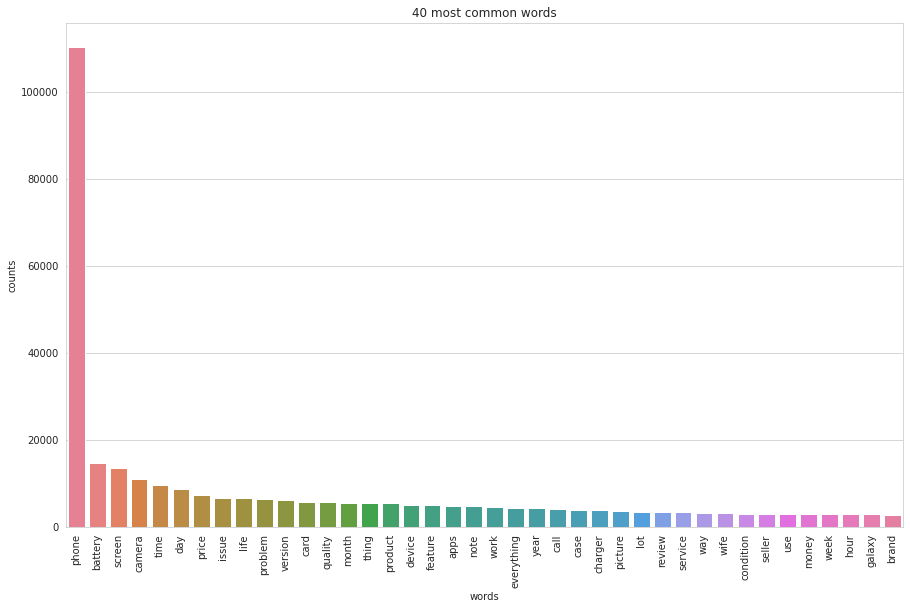

In [ ]:
# Load the library with the CountVectorizer method
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Helper function
def plot_40_most_common_words(count_data, count_vectorizer):
#     import matplotlib.pyplot as plt
    words = count_vectorizer.get_feature_names()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts += t.toarray()[0]
    
    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:40]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words)) 
    
    plt.figure(2, figsize=(15, 15/1.6180))
    plt.subplot(title='40 most common words')
    sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2.5})
    sns.barplot(x_pos, counts, palette='husl')
    plt.xticks(x_pos, words, rotation=90) 
    plt.xlabel('words')
    plt.ylabel('counts')
    plt.show()
    
# Initialise the count vectorizer with the English stop words
count_vectorizer = CountVectorizer(stop_words=stopwords)

review_list = []
for r in data_nouns_normal_stopwords_lemma['review']:
    review_list.append(r)

# Fit and transform the processed titles
count_data = count_vectorizer.fit_transform(review_list)

# Visualise the 40 most common words
plot_40_most_common_words(count_data, count_vectorizer)


### 4.3 Remove Additional Meaningless Stopwords
<br>
<div style="text-align: justify">
To filter out words that do not add value to our study, the stopword list was extended by filtering manually using the top 40 words that we have plotted previously. <br>

However since this is being done manually, there are still redundant words not filtered which could dominate the top words distribution for each topic, hence resulting in an inaccurate interpretation of topics.
</div>

In [ ]:
stopwords.extend(['phone', 'phones','just', 'use', 'new', 'now','ever','make','cell','time','out','there',
                  'last','year','have','used','came','mobile','much','one','really','day',
                  'still','month','thing','note','far','using','year', 'en', 'la','everything',
                  'anyone','wife','cousin','amazon','con','es','work','works',
                 'like', 'im', 'know', 'just', 'dont', 'thats', 'right', 'people','youre', 'got', 
                  'gonna', 'time', 'think', 'yeah', 'said','product','seller','day','month','device','lot','review','way',
                 'week','brand','husband','lo','son','day','call','para'])
def nouns(text):
    '''Given a string of text, tokenize the text and pull out only the nouns.'''
    is_noun = lambda pos: pos[:2] == 'NN'
    tokenized = word_tokenize(text)
#     lemma = lemmatizer.lemmatize(tokenized)
#     all_nouns = [word for (word, pos) in pos_tag(tokenized) if (is_noun(pos) and word not in stopwords)]
    all_nouns = [word for (word, pos) in pos_tag(tokenized) if (is_noun(pos) and word not in stopwords)]
#     return ' '.join(all_nouns)
    return all_nouns

In [ ]:
data_nouns = pd.DataFrame(df["review"].apply(nouns))

In [ ]:
data_nouns.head()

,review
0,[service]
1,"[service, problems, calls, shot, opinion, comp..."
2,"[person, problems]"
3,"[star, fees]"
4,"[projects, wonders]"


### 4.4 Lemmatize Words
<br>
<div style="text-align: justify">
In order to convert the words to its base form, lemmatization is being done using "wordnet"and "WordNetLemmatizer" packages. This will be done after removing the stopwords as it is not possible for us to know the lemmatized version of the additional words that do not bring value to our analysis.
</div>

In [ ]:
from nltk.stem import WordNetLemmatizer 
  
lemmatizer = WordNetLemmatizer()
dic = []

def return_lemma(text):    
    all_lemma = [lemmatizer.lemmatize(word) for word in text]
    dic.append(all_lemma)
    return ' '.join(all_lemma)

#if this code doesn't work on you, it's probably indentaion mistake coming from Medium writing format.

In [ ]:
data_lemma_nouns = pd.DataFrame(data_nouns["review"].apply(return_lemma))

In [ ]:
lemmatised_words = []
def lemmatise(text):
    lem = [lemmatizer.lemmatize(word) for word in text]
#     lemmatised_words.append(lem)
    return lem

In [ ]:
lemma_of_corpus = data_nouns['review'].apply(lemmatise)

In [ ]:
lemma_of_corpus

0                                                [service]
1         [service, problem, call, shot, opinion, company]
2                                        [person, problem]
3                                              [star, fee]
4                                        [project, wonder]
                               ...                        
67085    [camera, screen, color, processor, bug, rarity...
67086    [opera, user, year, notch, chin, pesky, edge, ...
67087                                                   []
67088                                    [look, recommend]
67089                         [size, style, size, feature]
Name: review, Length: 67090, dtype: object

### 4.5 Create Vectorizer

In [ ]:
temp = []
for data in lemma_of_corpus:
    temp.append(data)
print(temp[:3])

[['service'], ['service', 'problem', 'call', 'shot', 'opinion', 'company'], ['person', 'problem']]


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



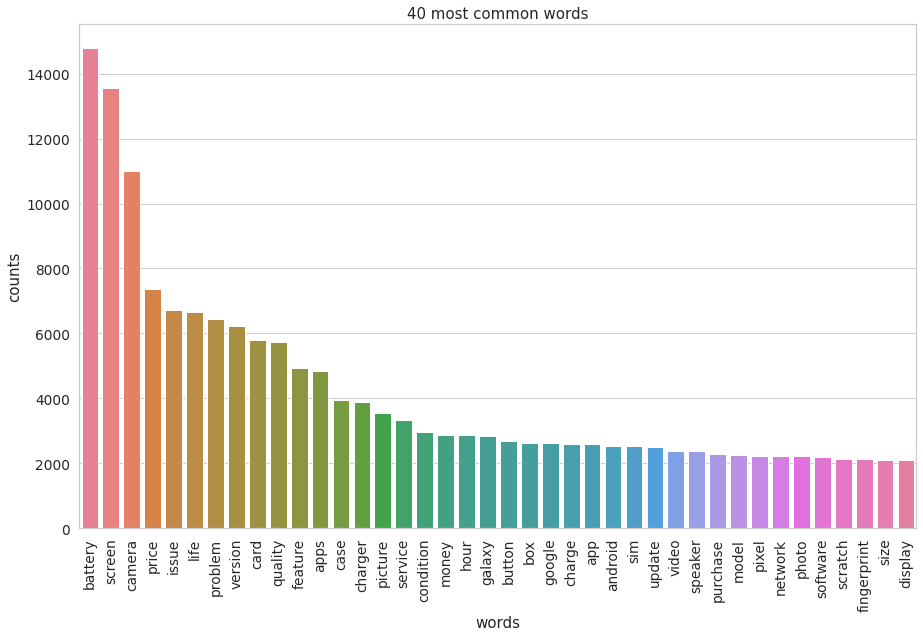

In [ ]:
# Load the library with the CountVectorizer method
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Helper function
def plot_40_most_common_words(count_data, count_vectorizer):
#     import matplotlib.pyplot as plt
    words = count_vectorizer.get_feature_names()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts += t.toarray()[0]
    
    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:40]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words)) 
    
    plt.figure(2, figsize=(15, 15/1.6180))
    plt.subplot(title='40 most common words')
    sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2.5})
    sns.barplot(x_pos, counts, palette='husl')
    plt.xticks(x_pos, words, rotation=90) 
    plt.xlabel('words')
    plt.ylabel('counts')
    plt.show()
    
# Initialise the count vectorizer with the English stop words
count_vectorizer = CountVectorizer(stop_words=stopwords)

review_list = []
for r in data_lemma_nouns['review']:
    review_list.append(r)

# Fit and transform the processed titles
count_data = count_vectorizer.fit_transform(review_list)

# Visualise the 40 most common words
plot_40_most_common_words(count_data, count_vectorizer)


In [ ]:
l = []
for r in data_lemma_nouns['review']:
    l.append(r)
print(l[:2])

['service', 'service problem call shot opinion company']


In [ ]:
data_lemma_nouns.head()

,review
0,service
1,service problem call shot opinion company
2,person problem
3,star fee
4,project wonder


In [ ]:
print(dic[:2])

[['service'], ['service', 'problem', 'call', 'shot', 'opinion', 'company']]


### 4.6 Recreate Document Term Matrix
<br>
<div style="text-align: justify">
After which, the list of words will be converted into bag-of-words format with two tuples (the ID of the token as well as the count/frequency of the token).
</div>

In [ ]:
import gensim
from gensim import corpora

gensim_dictionary = corpora.Dictionary(dic)
gensim_corpus = [gensim_dictionary.doc2bow(token) 
                 for token in dic]
print(gensim_corpus[:2])

print(len(gensim_dictionary))
print(len(gensim_corpus))
print(gensim_dictionary)

[[(0, 1)], [(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]]
11139
67090
Dictionary(11139 unique tokens: ['service', 'call', 'company', 'opinion', 'problem']...)


In [ ]:
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Re-add the additional stop words since we are recreating the document-term matrix
# add_stop_words = ['like', 'im', 'know', 'just', 'dont', 'thats', 'right', 'people','youre', 'got', 'gonna', 'time', 'think', 'yeah', 'said']
# stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

# Recreate a document-term matrix with only nouns
cvn = CountVectorizer(stop_words=stopwords)
cvn = CountVectorizer()
data_cvn = cvn.fit_transform(data_lemma_nouns["review"])
data_dtmn = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())
data_dtmn.index = data_nouns.index
data_dtmn

,10,100,1025,1035,1043,11,111,12,120,14,15,15th,16,17,19,1st,2018,2019,22,24,30,34,38,40,520,600,64,80,893,914,aback,abandon,abate,abhorrent,ability,ablaze,abnormality,abomination,about,above,...,yawn,yawner,ye,yea,year,years,yelling,yellow,yelp,yen,yep,yes,yesterday,yesteryear,yet,yield,yippee,yo,yoga,you,youngster,youth,yr,yrs,yuck,yuk,yup,zap,zen,zero,zest,zilch,zillion,zing,zip,zirconium,zombie,zone,zoom,zooming
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67085,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
67086,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
67087,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
67088,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### 4.7 Run LDA Model
<br>
<div style="text-align: justify">
In hope to find the highest coherence score, we decided to run the LDA model on different number of topics ranging from 2 to 7. To address the inconsistent output while performing topic modelling, a random state of 125 was set to ensure the optimal number of topics, coherence score and top words achieved is consistent throughout.
</div>

In [ ]:
from gensim import interfaces, utils, matutils
import scipy

corpusn=matutils.Sparse2Corpus(scipy.sparse.csr_matrix(data_dtmn.transpose()))

# Create the vocabulary dictionary
id2wordn = dict((v, k) for k, v in cvn.vocabulary_.items())

#### 4.7.1 Number of topics - 2

In [ ]:
 from gensim.models.ldamodel import LdaModel

ldana = LdaModel(corpus=corpusn, num_topics=2, id2word=id2wordn, passes=10, random_state=125)
ldana.print_topics()

[(0,
  '0.027*"version" + 0.026*"card" + 0.026*"problem" + 0.022*"issue" + 0.018*"charger" + 0.016*"sim" + 0.016*"money" + 0.014*"service" + 0.013*"box" + 0.013*"network"'),
 (1,
  '0.037*"camera" + 0.036*"battery" + 0.034*"screen" + 0.022*"price" + 0.019*"life" + 0.017*"quality" + 0.014*"feature" + 0.011*"fingerprint" + 0.010*"case" + 0.010*"picture"')]

In [ ]:
from gensim.models import CoherenceModel

coherence_model_lda_2 = CoherenceModel(model=ldana, texts=temp, dictionary=gensim_dictionary, coherence='c_v')
coherence_lda_2 = coherence_model_lda_2.get_coherence()
print('Coherence Score: ', coherence_lda_2)

Coherence Score:  0.756115702098904


#### 4.7.2 Number of topics - 3

In [ ]:
ldan_3 = LdaModel(corpus=corpusn, num_topics=3, id2word=id2wordn, passes=10, random_state=125)
ldan_3.print_topics()

[(0,
  '0.041*"issue" + 0.038*"problem" + 0.022*"money" + 0.018*"month" + 0.017*"service" + 0.015*"day" + 0.014*"call" + 0.014*"screen" + 0.011*"support" + 0.010*"update"'),
 (1,
  '0.042*"camera" + 0.041*"battery" + 0.033*"screen" + 0.021*"life" + 0.020*"quality" + 0.016*"feature" + 0.015*"price" + 0.013*"fingerprint" + 0.011*"picture" + 0.010*"case"'),
 (2,
  '0.051*"card" + 0.050*"version" + 0.049*"price" + 0.032*"charger" + 0.031*"sim" + 0.024*"box" + 0.019*"carrier" + 0.019*"condition" + 0.016*"network" + 0.016*"scratch"')]

In [ ]:
from gensim.models import CoherenceModel

coherence_model_lda_3 = CoherenceModel(model=ldan_3, texts=temp, dictionary=gensim_dictionary, coherence='c_v')
coherence_lda_3 = coherence_model_lda_3.get_coherence()
print('Coherence Score: ', coherence_lda_3)

Coherence Score:  0.7484332926506955


#### 4.7.3 Number of topics - 4

In [ ]:
ldan_4 = LdaModel(corpus=corpusn, num_topics=4, id2word=id2wordn, passes=10, random_state=125)
ldan_4.print_topics()

[(0,
  '0.038*"version" + 0.035*"card" + 0.027*"problem" + 0.026*"sim" + 0.024*"charger" + 0.022*"issue" + 0.021*"service" + 0.020*"money" + 0.020*"network" + 0.017*"box"'),
 (1,
  '0.065*"camera" + 0.063*"battery" + 0.038*"price" + 0.033*"life" + 0.030*"quality" + 0.027*"screen" + 0.020*"fingerprint" + 0.019*"feature" + 0.017*"picture" + 0.013*"video"'),
 (2,
  '0.025*"pixel" + 0.025*"galaxy" + 0.022*"headphone" + 0.018*"value" + 0.015*"flagship" + 0.014*"jack" + 0.012*"look" + 0.012*"opera" + 0.012*"hand" + 0.012*"case"'),
 (3,
  '0.052*"screen" + 0.023*"google" + 0.020*"issue" + 0.017*"apps" + 0.017*"case" + 0.016*"app" + 0.015*"update" + 0.013*"problem" + 0.013*"button" + 0.012*"software"')]

In [ ]:
from gensim.models import CoherenceModel

coherence_model_lda_4 = CoherenceModel(model=ldan_4, texts=temp, dictionary=gensim_dictionary, coherence='c_v')
coherence_lda_4 = coherence_model_lda_4.get_coherence()
print('Coherence Score: ', coherence_lda_4)

Coherence Score:  0.7665958429651134


#### 4.7.4 Number of topics - 5

In [ ]:
ldana_5 = LdaModel(corpus=corpusn, num_topics=5, id2word=id2wordn, passes=10, random_state=125)
ldana_5.print_topics()

[(0,
  '0.047*"screen" + 0.040*"charger" + 0.029*"money" + 0.026*"box" + 0.025*"problem" + 0.023*"case" + 0.023*"condition" + 0.023*"month" + 0.019*"scratch" + 0.018*"purchase"'),
 (1,
  '0.063*"camera" + 0.061*"battery" + 0.039*"screen" + 0.037*"price" + 0.031*"life" + 0.026*"quality" + 0.019*"fingerprint" + 0.018*"feature" + 0.015*"picture" + 0.012*"display"'),
 (2,
  '0.029*"headphone" + 0.025*"speaker" + 0.020*"flagship" + 0.019*"jack" + 0.017*"galaxy" + 0.016*"opera" + 0.015*"excellent" + 0.014*"edge" + 0.014*"band" + 0.013*"hand"'),
 (3,
  '0.032*"issue" + 0.028*"google" + 0.023*"pixel" + 0.023*"apps" + 0.021*"update" + 0.020*"app" + 0.018*"problem" + 0.015*"software" + 0.013*"call" + 0.012*"android"'),
 (4,
  '0.065*"card" + 0.065*"version" + 0.040*"sim" + 0.033*"service" + 0.031*"network" + 0.026*"carrier" + 0.020*"price" + 0.014*"customer" + 0.012*"problem" + 0.012*"sprint"')]

In [ ]:
from gensim.models import CoherenceModel

coherence_model_lda_5 = CoherenceModel(model=ldana_5, texts=temp, dictionary=gensim_dictionary, coherence='c_v')
coherence_lda_5 = coherence_model_lda_5.get_coherence()
print('Coherence Score: ', coherence_lda_5)

Coherence Score:  0.7419115432656544


#### 4.7.5 Number of topics - 6

In [ ]:
ldana_6 = LdaModel(corpus=corpusn, num_topics=6, id2word=id2wordn, passes=10, random_state=125)
ldana_6.print_topics()

[(0,
  '0.058*"charger" + 0.050*"screen" + 0.043*"box" + 0.033*"condition" + 0.033*"problem" + 0.027*"scratch" + 0.025*"case" + 0.023*"purchase" + 0.022*"protector" + 0.018*"issue"'),
 (1,
  '0.072*"camera" + 0.070*"battery" + 0.044*"price" + 0.037*"screen" + 0.036*"life" + 0.030*"quality" + 0.022*"fingerprint" + 0.020*"feature" + 0.018*"picture" + 0.012*"reader"'),
 (2,
  '0.028*"pixel" + 0.024*"headphone" + 0.019*"galaxy" + 0.018*"speaker" + 0.017*"screen" + 0.016*"flagship" + 0.016*"jack" + 0.015*"hand" + 0.014*"display" + 0.013*"opera"'),
 (3,
  '0.032*"issue" + 0.029*"google" + 0.024*"apps" + 0.022*"update" + 0.020*"app" + 0.017*"software" + 0.016*"problem" + 0.013*"call" + 0.012*"pixel" + 0.011*"setting"'),
 (4,
  '0.072*"card" + 0.071*"version" + 0.043*"sim" + 0.035*"service" + 0.034*"network" + 0.029*"carrier" + 0.019*"price" + 0.014*"sprint" + 0.013*"store" + 0.012*"unlock"'),
 (5,
  '0.060*"money" + 0.049*"month" + 0.027*"screen" + 0.022*"warranty" + 0.021*"function" + 0.020*

In [ ]:
coherence_model_lda_6 = CoherenceModel(model=ldana_6, texts=temp, dictionary=gensim_dictionary, coherence='c_v')
coherence_lda_6 = coherence_model_lda_6.get_coherence()
print('Coherence Score: ', coherence_lda_6)

Coherence Score:  0.7428837118527749


#### 4.7.6 Number of topics - 7

In [ ]:
ldana_7 = LdaModel(corpus=corpusn, num_topics=7, id2word=id2wordn, passes=10, random_state=125)
ldana_7.print_topics()

[(0,
  '0.098*"problem" + 0.034*"update" + 0.032*"function" + 0.025*"mi" + 0.022*"model" + 0.018*"band" + 0.016*"issue" + 0.014*"software" + 0.014*"factory" + 0.013*"lens"'),
 (1,
  '0.088*"battery" + 0.061*"camera" + 0.046*"life" + 0.037*"price" + 0.035*"screen" + 0.028*"quality" + 0.028*"fingerprint" + 0.021*"picture" + 0.019*"feature" + 0.015*"reader"'),
 (2,
  '0.039*"camera" + 0.027*"pixel" + 0.023*"screen" + 0.021*"price" + 0.017*"quality" + 0.015*"display" + 0.014*"android" + 0.014*"galaxy" + 0.013*"performance" + 0.013*"hand"'),
 (3,
  '0.039*"apps" + 0.030*"google" + 0.026*"app" + 0.015*"setting" + 0.015*"issue" + 0.012*"system" + 0.012*"update" + 0.012*"video" + 0.011*"thing" + 0.011*"notification"'),
 (4,
  '0.097*"card" + 0.096*"version" + 0.059*"sim" + 0.046*"network" + 0.039*"carrier" + 0.018*"sprint" + 0.017*"store" + 0.016*"price" + 0.016*"data" + 0.014*"service"'),
 (5,
  '0.050*"money" + 0.047*"issue" + 0.038*"month" + 0.032*"service" + 0.021*"day" + 0.021*"problem" +

In [ ]:
coherence_model_lda_7 = CoherenceModel(model=ldana_7, texts=temp, dictionary=gensim_dictionary, coherence='c_v')
coherence_lda_7 = coherence_model_lda_7.get_coherence()
print('Coherence Score: ', coherence_lda_7)

Coherence Score:  0.7264171096440578


### 4.8 Summary of Topics

In [ ]:
coherence_score = pd.DataFrame([coherence_lda_2, coherence_lda_3, coherence_lda_4, coherence_lda_5, coherence_lda_6, coherence_lda_7],
                              ['2','3','4','5','6','7'], columns=['Coherence Score'])
coherence_score

,Coherence Score
2,0.756116
3,0.748433
4,0.766596
5,0.741912
6,0.742884
7,0.726417


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



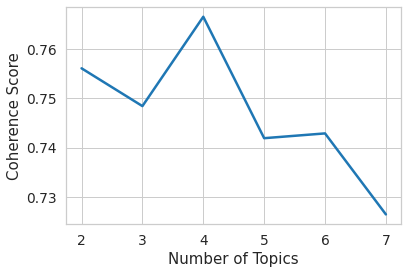

In [ ]:
plt.xlabel("Number of Topics")
sns.lineplot(coherence_score.index, coherence_score['Coherence Score'])

#### Key Takeaways
<br>
<div style="text-align: justify">
Based on the coherence score of each of the number of topics (ranging from 2 to 7) that we have generated, num_topics of 4 has the highest coherence score of 0.7666. Hence, we will be working on 4 topics since higher topic coherence offers meaningful and interpretable topics.
</div>

### 4.9 Find Dominant Topic
<br>
<div style="text-align: justify">
We will then find the dominant topic for each review to see which topic has the highest distribution and is more dominant.
</div>

In [ ]:
def format_topics_sentences(ldamodel=ldan_4, corpus=corpusn, texts=temp):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

df_topic_sents_keywords = format_topics_sentences(ldamodel=ldan_4, corpus=corpusn, texts=temp)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,0.0,0.6250,"version, card, problem, sim, charger, issue, s...",[service]
1,1,0.0,0.6026,"version, card, problem, sim, charger, issue, s...","[service, problem, call, shot, opinion, company]"
2,2,3.0,0.7383,"screen, google, issue, apps, case, app, update...","[person, problem]"
3,3,0.0,0.7482,"version, card, problem, sim, charger, issue, s...","[star, fee]"
4,4,2.0,0.4170,"pixel, galaxy, headphone, value, flagship, jac...","[project, wonder]"
5,5,3.0,0.5028,"screen, google, issue, apps, case, app, update...","[problem, service, problem, service, contract,..."
6,6,0.0,0.7500,"version, card, problem, sim, charger, issue, s...","[boost, sim]"
7,7,1.0,0.5638,"camera, battery, price, life, quality, screen,...","[lg, sim, card, drawback, candy, bar, style, b..."
8,8,0.0,0.6417,"version, card, problem, sim, charger, issue, s...","[replacement, sims, case, stead, spending, rea..."
9,9,0.0,0.7494,"version, card, problem, sim, charger, issue, s...","[charger, card]"


### 4.10 Label the Topics
<br>
<div style="text-align: justify">
Based on the top 10-ranked words of each of the topic, we have interpreted the topic labels for each of them as follows: <br>
    - 0. Hardware and Network Issues <br>
    - 1. Camera, Battery and Features <br>
    - 2. Brands and Models <br>
    - 3. Software Issues
</div>

In [ ]:
def assign_topic(dominant):
    if dominant == 0.0:
        return "Hardware and Network Issues"
    elif dominant == 1.0:
        return "Camera, Battery and Features"
    elif dominant == 2.0:
        return "Brands and Models"
    else:
        return "Software Issues"

In [ ]:
df_dominant_topic['Topic_Label'] = df_dominant_topic['Dominant_Topic'].apply(assign_topic)

In [ ]:
df_dominant_topic['Topic_Label'].value_counts()

Hardware and Network Issues     30385
Camera, Battery and Features    16728
Software Issues                 12190
Brands and Models                7787
Name: Topic_Label, dtype: int64

### 4.11 Plot Topic Distribution

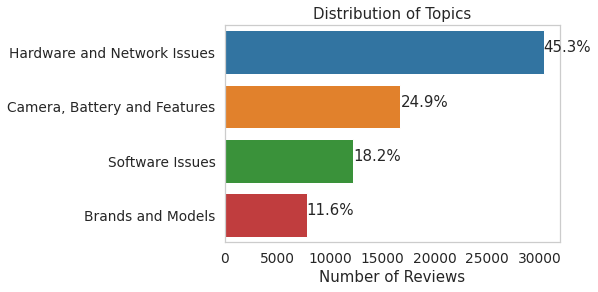

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# df = pd.DataFrame(np.array([['a'], ['a'], ['b']]), columns=['current_status'])
ax = sns.barplot(x=df_dominant_topic['Topic_Label'].value_counts(), y=df_dominant_topic['Topic_Label'].value_counts().index)
ax.grid(False)
plt.title('Distribution of Topics')
plt.xlabel('Number of Reviews')

total = len(df_dominant_topic['Topic_Label'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

#### Key Takeaways
<br>
<div style="text-align: justify">
Based on the topic distribution graph, we can see that hardware and network issues have the highest distribution. This shows that many users experienced issues with this aspect. Therefore, cell phone companies can priortize the quality of the hardware and should work closely with telecommunication companies to ensure that the network connectivity is compatible with the cell phones. <br>

Moreover, companies should also place emphasis on the camera, battery and features which have the second highest topic distribution.
</div>

## 5. Sentiment analysis

### 5.1 Get Sentiment of Text

#### 5.1.1 Use Azure Text Analytics

In [ ]:
# with azure api
from azure.ai.textanalytics import TextAnalyticsClient
from azure.core.credentials import AzureKeyCredential

key = "c5f36ae21ed64b6fac64b424ad32c421"
endpoint = "https://southeastasia.api.cognitive.microsoft.com/"

def authenticate_client():
    try:
        ta_credential = AzureKeyCredential(key)
        text_analytics_client = TextAnalyticsClient(
                endpoint=endpoint, credential=ta_credential)
        return text_analytics_client
    except:
        return ''

client = authenticate_client()
def sentiment_analysis(client,text):
    documents = [text]
    response = client.analyze_sentiment(documents = documents)[0]
    return response.sentiment

In [ ]:
# azure api only able to accept len of 5120 character
# beware of long run time, estimated 2 hour
df=df[df['review'].map(len) < 5120]
sentlist = []

for text in df.review:

    sentiment = sentiment_analysis(client, text)
    sentlist.append(sentiment)

In [ ]:
df['Sentiment']=sentlist

In [ ]:
df

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review,Sentiment
0,B00V8STWY8,Apple,2.7,6,3,not what it says it is,wrong product... it said pad air and it’s an p...,positive
1,B00V8STWY8,Apple,2.7,6,2,two stars,had a dent in the back,negative
2,B00V8STWY8,Apple,2.7,6,1,no warranty on certified refurbished from squa...,purchased this certified refurbished pad air i...,mixed
3,B00V8STWY8,Apple,2.7,6,5,five stars,love,positive
4,B00V8STWY8,Apple,2.7,6,1,i do not recommend this ipad,there is no sims card in this. pad i assumed t...,negative
...,...,...,...,...,...,...,...,...
66908,B07ZPJBN55,Motorola,4.1,8,5,great for the pricr,it was great for the price,positive
66909,B07ZPJBN55,Motorola,4.1,8,1,mucho problema,no me ha legato,negative
66910,B07ZPJBN55,Motorola,4.1,8,5,great phone for budget minded,great phone display is crisp layout is nice,positive
66911,B07ZPJBN55,Motorola,4.1,8,5,exelente!!!,rapidly,neutral


In [ ]:
df.to_csv('processed-final_with_sentiment.csv', index=False)

#### 5.1.2 Use TextBlob

In [ ]:
final_sentiment = pd.read_csv('processed-final_with_sentiment.csv')
final_sentiment

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review,Sentiment
0,B00V8STWY8,Apple,2.7,6,3,not what it says it is,wrong product... it said pad air and it’s an p...,positive
1,B00V8STWY8,Apple,2.7,6,2,two stars,had a dent in the back,negative
2,B00V8STWY8,Apple,2.7,6,1,no warranty on certified refurbished from squa...,purchased this certified refurbished pad air i...,mixed
3,B00V8STWY8,Apple,2.7,6,5,five stars,love,positive
4,B00V8STWY8,Apple,2.7,6,1,i do not recommend this ipad,there is no sims card in this. pad i assumed t...,negative
...,...,...,...,...,...,...,...,...
66908,B07ZPJBN55,Motorola,4.1,8,5,great for the pricr,it was great for the price,positive
66909,B07ZPJBN55,Motorola,4.1,8,1,mucho problema,no me ha legato,negative
66910,B07ZPJBN55,Motorola,4.1,8,5,great phone for budget minded,great phone display is crisp layout is nice,positive
66911,B07ZPJBN55,Motorola,4.1,8,5,exelente!!!,rapidly,neutral


In [ ]:
final_sentiment['polarity'] = final_sentiment['review'].map(lambda text: TextBlob(text).sentiment.polarity)
final_sentiment['review_len'] = final_sentiment['review'].astype(str).apply(len)
final_sentiment['word_count'] = final_sentiment['review'].apply(lambda x: len(str(x).split()))
final_sentiment

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review,Sentiment,polarity,review_len,word_count
0,B00V8STWY8,Apple,2.7,6,3,not what it says it is,wrong product... it said pad air and it’s an p...,positive,0.10,130,29
1,B00V8STWY8,Apple,2.7,6,2,two stars,had a dent in the back,negative,0.00,22,6
2,B00V8STWY8,Apple,2.7,6,1,no warranty on certified refurbished from squa...,purchased this certified refurbished pad air i...,mixed,0.05,746,133
3,B00V8STWY8,Apple,2.7,6,5,five stars,love,positive,0.50,4,1
4,B00V8STWY8,Apple,2.7,6,1,i do not recommend this ipad,there is no sims card in this. pad i assumed t...,negative,0.10,275,52
...,...,...,...,...,...,...,...,...,...,...,...
66908,B07ZPJBN55,Motorola,4.1,8,5,great for the pricr,it was great for the price,positive,0.80,26,6
66909,B07ZPJBN55,Motorola,4.1,8,1,mucho problema,no me ha legato,negative,0.00,15,4
66910,B07ZPJBN55,Motorola,4.1,8,5,great phone for budget minded,great phone display is crisp layout is nice,positive,0.55,43,8
66911,B07ZPJBN55,Motorola,4.1,8,5,exelente!!!,rapidly,neutral,0.00,7,1


### 5.2  All Brand

In [ ]:
final_sentiment

,model_no,brand,avg_rating,total_review,cust_rating,review_title,review,Sentiment,polarity,review_len,word_count
0,B00V8STWY8,Apple,2.7,6,3,not what it says it is,wrong product... it said pad air and it’s an p...,positive,0.10,130,29
1,B00V8STWY8,Apple,2.7,6,2,two stars,had a dent in the back,negative,0.00,22,6
2,B00V8STWY8,Apple,2.7,6,1,no warranty on certified refurbished from squa...,purchased this certified refurbished pad air i...,mixed,0.05,746,133
3,B00V8STWY8,Apple,2.7,6,5,five stars,love,positive,0.50,4,1
4,B00V8STWY8,Apple,2.7,6,1,i do not recommend this ipad,there is no sims card in this. pad i assumed t...,negative,0.10,275,52
...,...,...,...,...,...,...,...,...,...,...,...
66908,B07ZPJBN55,Motorola,4.1,8,5,great for the pricr,it was great for the price,positive,0.80,26,6
66909,B07ZPJBN55,Motorola,4.1,8,1,mucho problema,no me ha legato,negative,0.00,15,4
66910,B07ZPJBN55,Motorola,4.1,8,5,great phone for budget minded,great phone display is crisp layout is nice,positive,0.55,43,8
66911,B07ZPJBN55,Motorola,4.1,8,5,exelente!!!,rapidly,neutral,0.00,7,1


In [ ]:
final_sentiment['brand'].value_counts()

Samsung     33195
Motorola     8809
Nokia        5818
Apple        5081
Xiaomi       4311
Google       3772
Sony         3144
HUAWEI       2187
OnePlus       346
ASUS          250
Name: brand, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



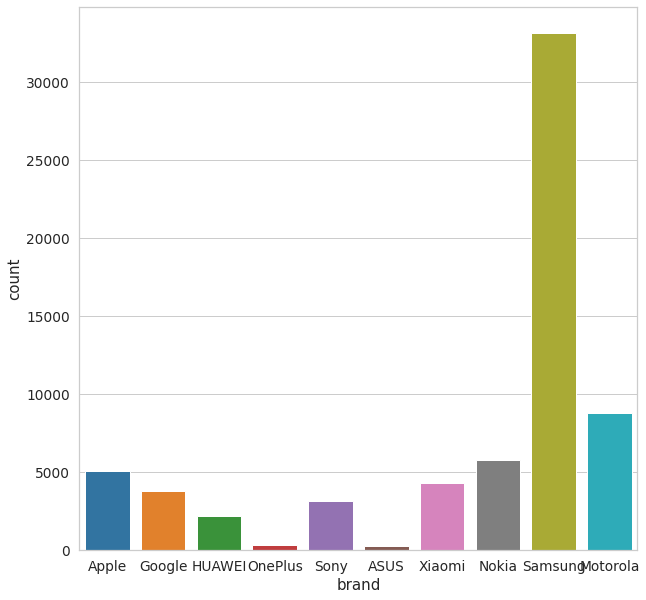

In [ ]:
plt.figure(figsize=(10,10))
sns.countplot(final_sentiment['brand'])

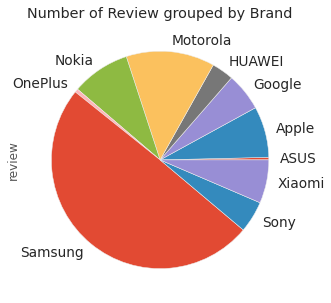

In [ ]:
plt.style.use("ggplot")
# Brand distribution
ax = final_sentiment.groupby("brand").count()["review"].plot(kind="pie", 
                                                 figsize=(8, 5),
                                                 title="Number of Review grouped by Brand")
plt.show()

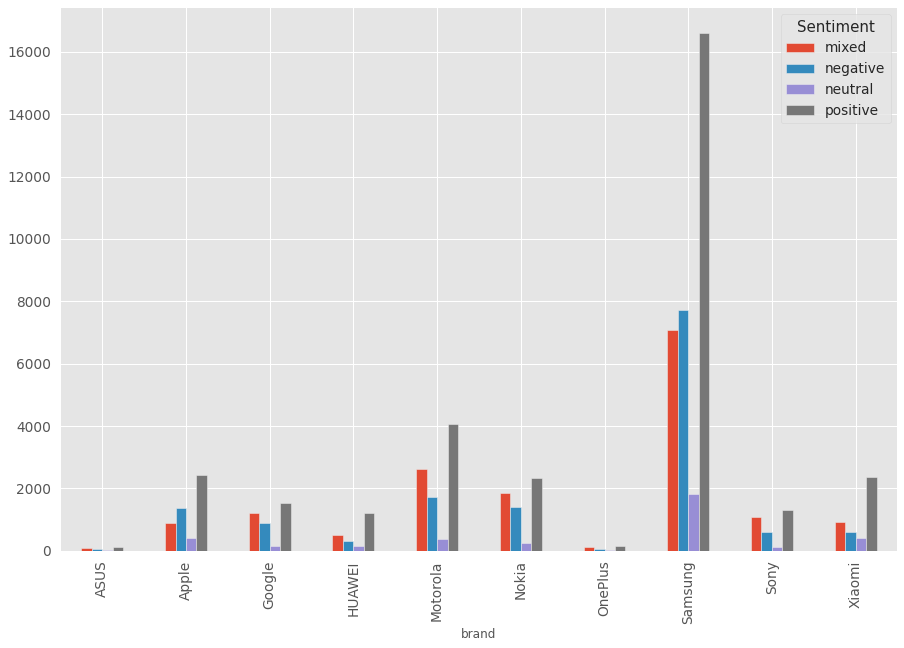

In [ ]:
final_sentiment.groupby(['brand','Sentiment']).size().unstack().plot(kind='bar',figsize=(15,10))

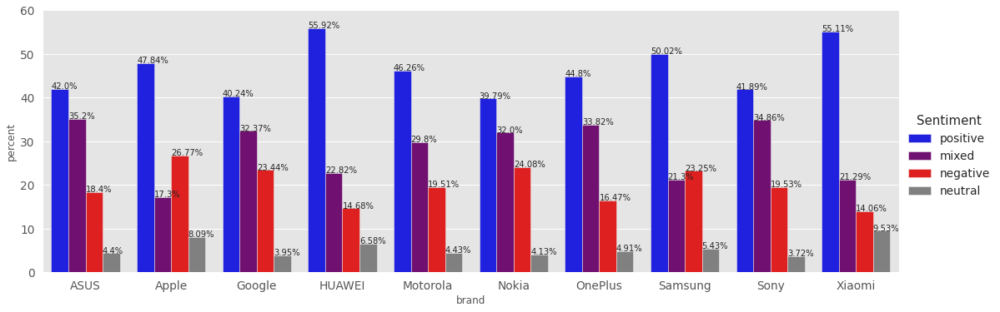

In [ ]:
x,y = 'brand', 'Sentiment'

df1 = final_sentiment.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1, height=5, aspect =3, palette=sns.color_palette(['blue','purple', 'red','grey']))
g.ax.set_ylim(0,60)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

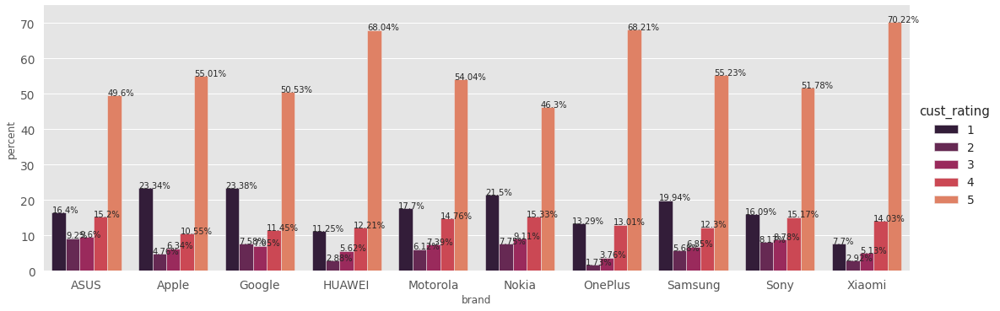

In [ ]:
x,y = 'brand', 'cust_rating'

df1 = final_sentiment.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1, height=5, aspect =3, palette=sns.color_palette("rocket"))
g.ax.set_ylim(0,75)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

In [8]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
final_sentiment['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [9]:
final_sentiment['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [9]:
y0 = final_sentiment.loc[final_sentiment['brand'] == 'Samsung']['polarity']
y1 = final_sentiment.loc[final_sentiment['brand'] == 'Motorola']['polarity']
y2 = final_sentiment.loc[final_sentiment['brand'] == 'Nokia']['polarity']
y3 = final_sentiment.loc[final_sentiment['brand'] == 'Xiaomi']['polarity']
y4 = final_sentiment.loc[final_sentiment['brand'] == 'Google']['polarity']
y5 = final_sentiment.loc[final_sentiment['brand'] == 'Sony']['polarity']
y6 = final_sentiment.loc[final_sentiment['brand'] == 'HUAWEI']['polarity']
y7 = final_sentiment.loc[final_sentiment['brand'] == 'OnePlus']['polarity']
y8 = final_sentiment.loc[final_sentiment['brand'] == 'ASUS']['polarity']
y9 = final_sentiment.loc[final_sentiment['brand'] == 'Apple']['polarity']

trace0 = go.Box(
    y=y0,
    name = 'Samsung',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Motorola',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Nokia',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Xiaomi',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Google',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Sony',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
trace6 = go.Box(
    y=y6,
    name = 'Huawei',
    marker = dict(
        color = 'rgb(10, 8, 20)',
    )
)
trace7 = go.Box(
    y=y7,
    name = 'OnePlus',
    marker = dict(
        color = 'rgb(120, 50, 100)',
    )
)
trace8 = go.Box(
    y=y8,
    name = 'Asus',
    marker = dict(
        color = 'rgb(50, 150, 20)',
    )
)
trace9 = go.Box(
    y=y9,
    name = 'Apple',
    marker = dict(
        color = 'rgb(255,165,0)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8,trace9]
layout = go.Layout(
    title = "Sentiment Polarity Boxplot of Brands"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Sentiment Polarity Boxplot of Brands")

In [11]:
y0 = final_sentiment.loc[final_sentiment['brand'] == 'Samsung']['cust_rating']
y1 = final_sentiment.loc[final_sentiment['brand'] == 'Motorola']['cust_rating']
y2 = final_sentiment.loc[final_sentiment['brand'] == 'Nokia']['cust_rating']
y3 = final_sentiment.loc[final_sentiment['brand'] == 'Xiaomi']['cust_rating']
y4 = final_sentiment.loc[final_sentiment['brand'] == 'Google']['cust_rating']
y5 = final_sentiment.loc[final_sentiment['brand'] == 'Sony']['cust_rating']
y6 = final_sentiment.loc[final_sentiment['brand'] == 'HUAWEI']['cust_rating']
y7 = final_sentiment.loc[final_sentiment['brand'] == 'OnePlus']['cust_rating']
y8 = final_sentiment.loc[final_sentiment['brand'] == 'ASUS']['cust_rating']
y9 = final_sentiment.loc[final_sentiment['brand'] == 'Apple']['cust_rating']

trace0 = go.Box(
    y=y0,
    name = 'Samsung',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Motorola',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Nokia',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Xiaomi',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Google',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Sony',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
trace6 = go.Box(
    y=y6,
    name = 'Huawei',
    marker = dict(
        color = 'rgb(10, 8, 20)',
    )
)
trace7 = go.Box(
    y=y7,
    name = 'OnePlus',
    marker = dict(
        color = 'rgb(120, 50, 100)',
    )
)
trace8 = go.Box(
    y=y8,
    name = 'Asus',
    marker = dict(
        color = 'rgb(50, 150, 20)',
    )
)
trace9 = go.Box(
    y=y9,
    name = 'Apple',
    marker = dict(
        color = 'rgb(255,165,0)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8, trace9]
layout = go.Layout(
    title = "Customer Ratings box plot of Brands"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Customer Ratings box plot of Brands")

In [12]:
#split by individual brand
Samsung_df=final_sentiment[final_sentiment["brand"]=="Samsung"]
Motorola_df=final_sentiment[final_sentiment["brand"]=="Motorola"]
Nokia_df=final_sentiment[final_sentiment["brand"]=="Nokia"]
Apple_df=final_sentiment[final_sentiment["brand"]=="Apple"]
Xiaomi_df=final_sentiment[final_sentiment["brand"]=="Xiaomi"]
Google_df=final_sentiment[final_sentiment["brand"]=="Google"]
Sony_df=final_sentiment[final_sentiment["brand"]=="Sony"]
HUAWEI_df=final_sentiment[final_sentiment["brand"]=="HUAWEI"]
OnePlus_df=final_sentiment[final_sentiment["brand"]=="OnePlus"]
ASUS_df=final_sentiment[final_sentiment["brand"]=="ASUS"]

## 4.3) By brand

### 4.3.1) Samsung

#### 4.3.1.1) General Analysis

In [ ]:
Samsung_df['Sentiment'].value_counts()

positive    16604
negative     7718
mixed        7070
neutral      1803
Name: Sentiment, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



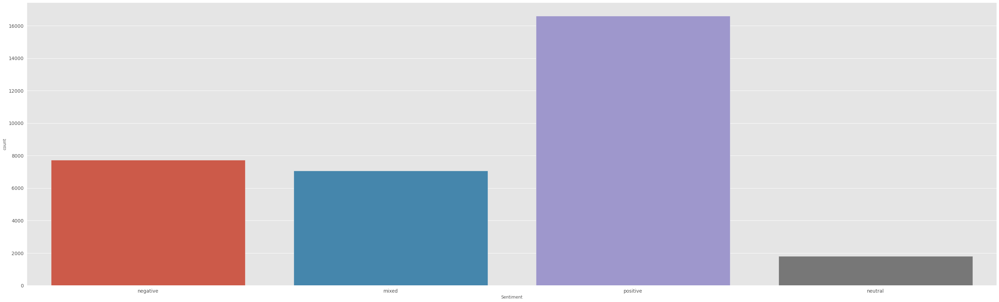

In [ ]:
plt.figure(figsize=(50,15))
sns.countplot(Samsung_df['Sentiment'])

In [13]:
# polarity distribution
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Samsung_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [14]:
# customer rating
Samsung_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [15]:
Samsung_pos_df=Samsung_df.loc[Samsung_df['Sentiment'] == 'positive']
Samsung_neg_df=Samsung_df.loc[Samsung_df['Sentiment'] == 'negative']

#### 4.3.1.2) Positive Analysis

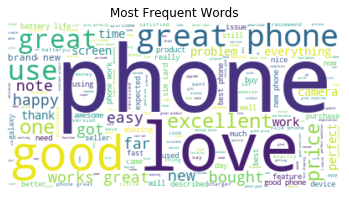

In [16]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Samsung_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

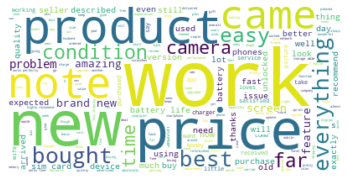

In [17]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','really','awesome'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#### 4.3.1.3) Negative Analysis

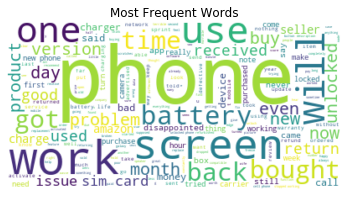

In [18]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Samsung_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

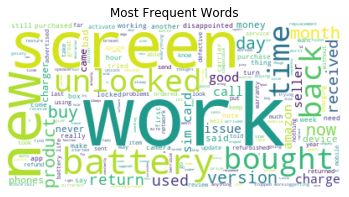

In [19]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','will','problem'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.3.1.4) Phone Model

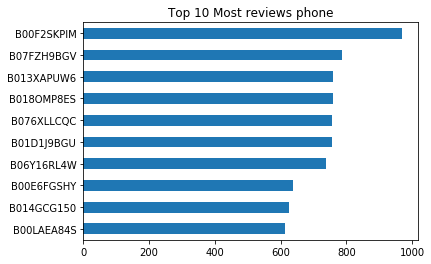

In [20]:
Samsung_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.3.2) Motorola


#### 4.3.2.1) General Analysis

In [21]:
Motorola_df['Sentiment'].value_counts()

positive    4075
mixed       2625
negative    1719
neutral      390
Name: Sentiment, dtype: int64

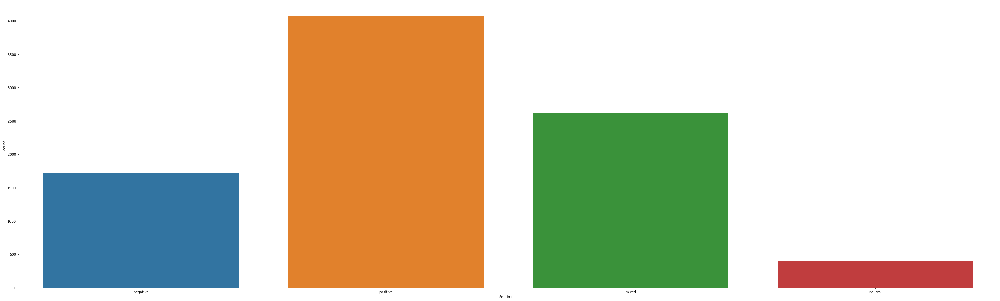

In [22]:
plt.figure(figsize=(50,15))
sns.countplot(Motorola_df['Sentiment'])

In [15]:
## polarity distribution
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Motorola_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [16]:
# customer rating
Motorola_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [25]:
Motorola_pos_df=Motorola_df.loc[Motorola_df['Sentiment'] == 'positive']
Motorola_neg_df=Motorola_df.loc[Motorola_df['Sentiment'] == 'negative']

#### 4.3.2.2) Positive Analysis

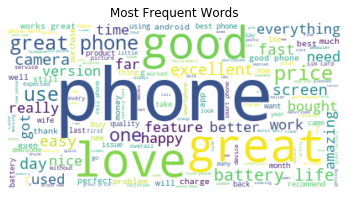

In [26]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Motorola_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

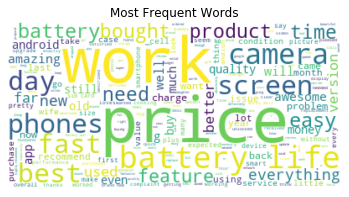

In [27]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','really'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.3.2.3) Negative Analysis

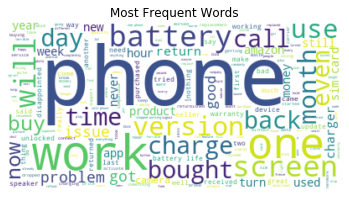

In [28]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Motorola_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

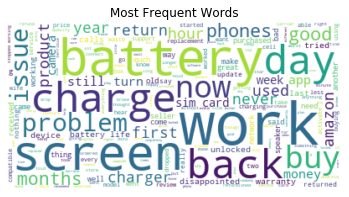

In [29]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','will','new','month','version','call','bought','time'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.3.2.4) Phone Model

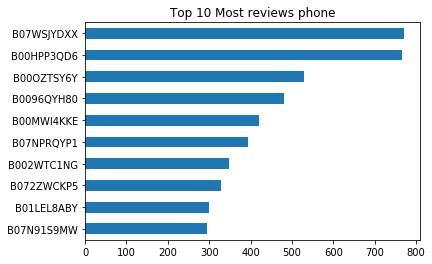

In [30]:
Motorola_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.3.3) Nokia

#### 4.3.3.1) General Analysis

In [31]:
Nokia_df['Sentiment'].value_counts()

positive    2315
mixed       1862
negative    1401
neutral      240
Name: Sentiment, dtype: int64

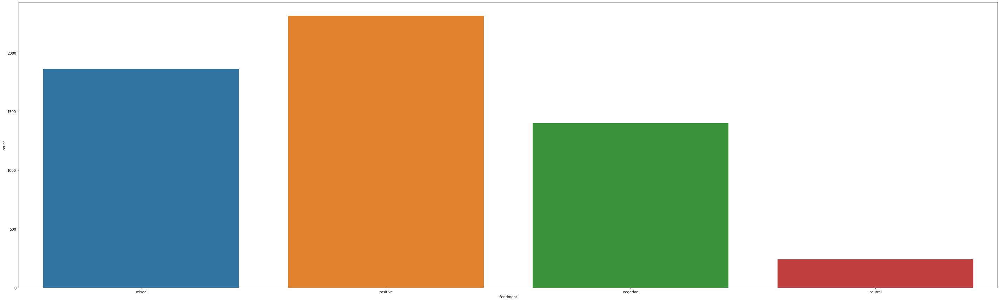

In [32]:
plt.figure(figsize=(50,15))
sns.countplot(Nokia_df['Sentiment'])

In [17]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Nokia_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [18]:
Nokia_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [20]:
Nokia_pos_df=Nokia_df.loc[Nokia_df['Sentiment'] == 'positive']
Nokia_neg_df=Nokia_df.loc[Nokia_df['Sentiment'] == 'negative']

#### 4.3.3.2) Positive Analysis

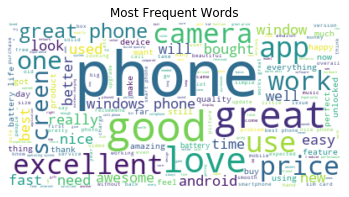

In [21]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Nokia_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

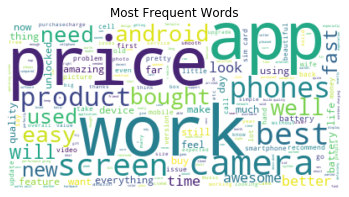

In [22]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','really','windows'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.3.3.3) Negative Analysis

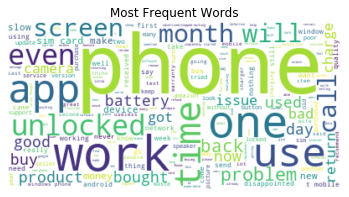

In [23]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Nokia_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

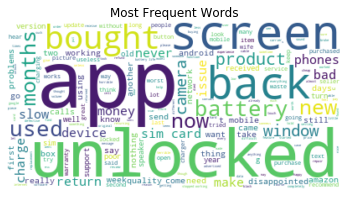

In [24]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','will','time','month','call','good','work','buy','day','problem'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.3.3.4) Phone Model

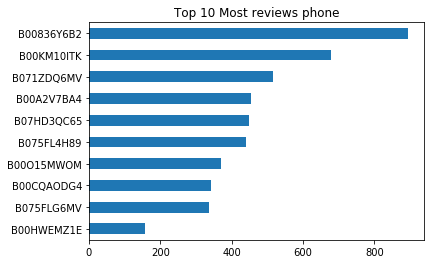

In [25]:
Nokia_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.4) Apple

#### 4.2.4.1) General Analysis

In [26]:
Apple_df['Sentiment'].value_counts()

positive    2431
negative    1360
mixed        879
neutral      411
Name: Sentiment, dtype: int64

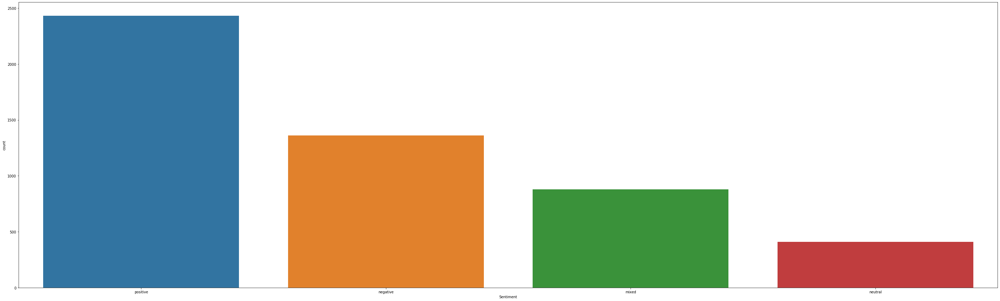

In [27]:
plt.figure(figsize=(50,15))
sns.countplot(Apple_df['Sentiment'])

In [28]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Apple_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [29]:
Apple_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [30]:
Apple_pos_df=Apple_df.loc[Apple_df['Sentiment'] == 'positive']
Apple_neg_df=Apple_df.loc[Apple_df['Sentiment'] == 'negative']

#### 4.2.4.2) Positive Analysis

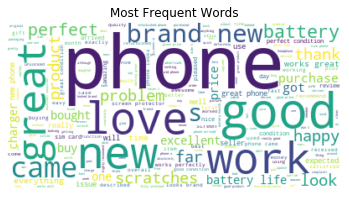

In [31]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Apple_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

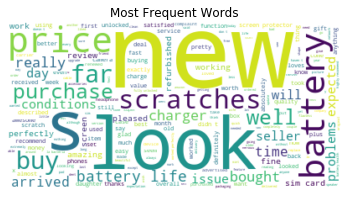

In [32]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','condition','product','came','brand','works','everything','problem'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.4.3) Negative Analysis

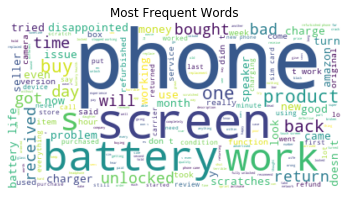

In [33]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Apple_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

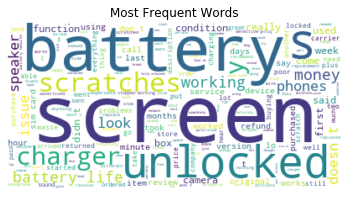

In [34]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','return','product','came','day','time','received','bad','work','will','new','bought','buy',
                  'disappointed','refurbished','back','problem','seller','good','charge','now','month','never','tried','amazon','phone','turn'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.4.4) Phone Model

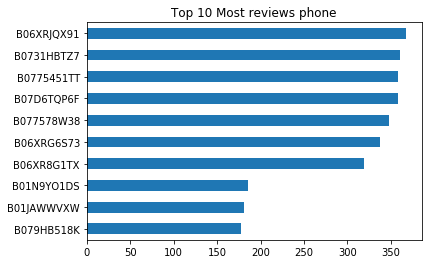

In [35]:
Apple_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.5) Xiaomi

#### 4.2.5.1) General Analysis

In [36]:
Xiaomi_df['Sentiment'].value_counts()

positive    2376
mixed        918
negative     606
neutral      411
Name: Sentiment, dtype: int64

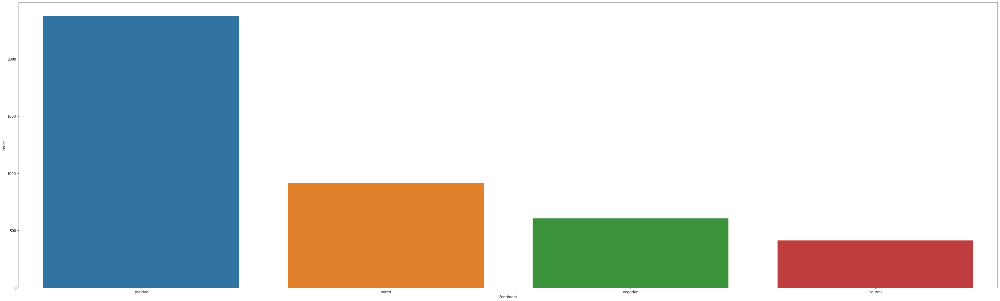

In [37]:
plt.figure(figsize=(50,15))
sns.countplot(Xiaomi_df['Sentiment'])

In [38]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Xiaomi_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [39]:
Xiaomi_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [40]:
Xiaomi_pos_df=Xiaomi_df.loc[Xiaomi_df['Sentiment'] == 'positive']
Xiaomi_neg_df=Xiaomi_df.loc[Xiaomi_df['Sentiment'] == 'negative']

#### 4.2.5.2) Positive Analysis

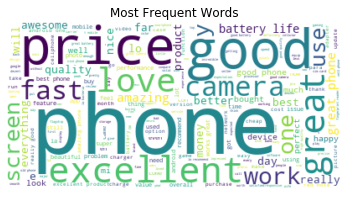

In [41]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Xiaomi_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

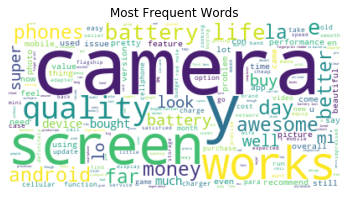

In [42]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','really','work','price','amazing','best','fast','product','will','work','everything'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.5.3) Negative Analysis

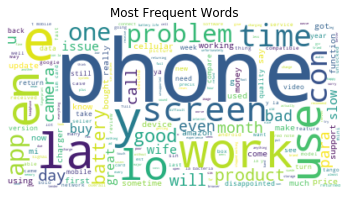

In [43]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Xiaomi_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

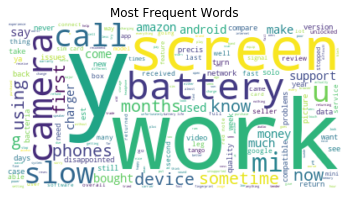

In [44]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','es','la','en','lo','problem','con','good','time',
                  'will','apps','product','buy','para','month','mobile','wife','day','really','update','issue','bad','great','cellular','working','price','function','sin'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.5.4) Phone Model

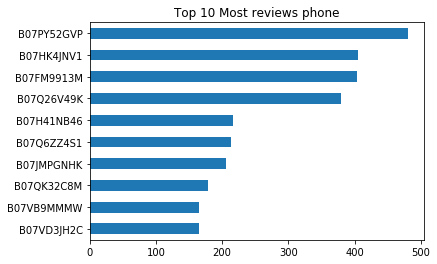

In [45]:
Xiaomi_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.6) Google

#### 4.2.6.1) General Analysis

In [46]:
Google_df['Sentiment'].value_counts()

positive    1518
mixed       1221
negative     884
neutral      149
Name: Sentiment, dtype: int64

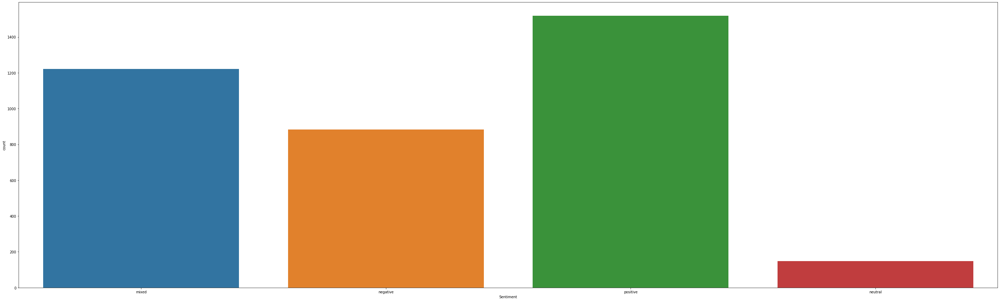

In [47]:
plt.figure(figsize=(50,15))
sns.countplot(Google_df['Sentiment'])

In [48]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Google_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [49]:
Google_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [50]:
Google_pos_df=Google_df.loc[Google_df['Sentiment'] == 'positive']
Google_neg_df=Google_df.loc[Google_df['Sentiment'] == 'negative']

#### 4.2.6.2) Positive Analysis

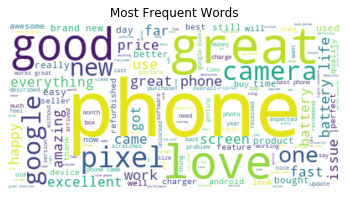

In [51]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Google_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

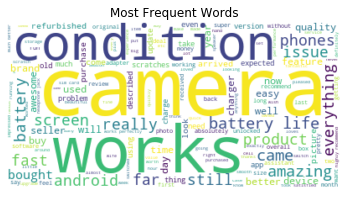

In [52]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','work','google','new','best','work','price','pixel'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.6.3) Negative Analysis

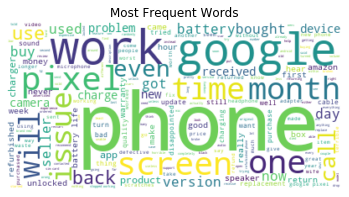

In [53]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Google_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

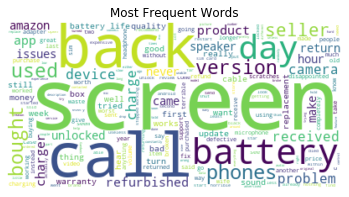

In [54]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','month','will','time','buy','work','google','new','now','months','issue','pixel'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.6.4) Phone Model

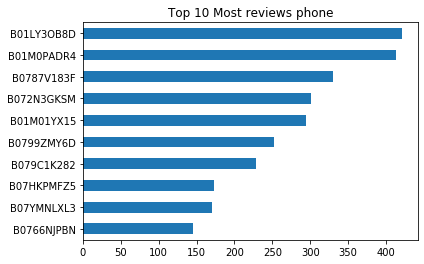

In [55]:
Google_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.7) Sony

#### 4.2.7.1) General Analysis

In [50]:
Sony_df['Sentiment'].value_counts()

positive    1317
mixed       1096
negative     614
neutral      117
Name: Sentiment, dtype: int64

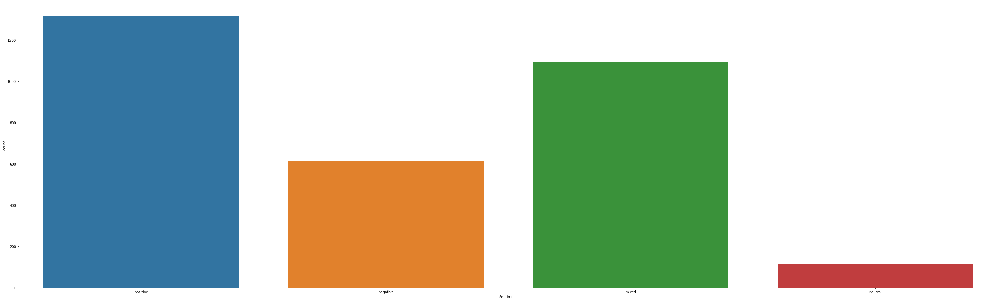

In [51]:
plt.figure(figsize=(50,15))
sns.countplot(Sony_df['Sentiment'])

In [56]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

Sony_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [57]:
Sony_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [58]:
Sony_pos_df=Sony_df.loc[Sony_df['Sentiment'] == 'positive']
Sony_neg_df=Sony_df.loc[Sony_df['Sentiment'] == 'negative']

#### 4.2.7.2) Positive Analysis

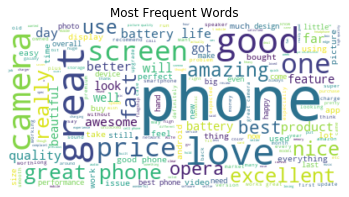

In [55]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Sony_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

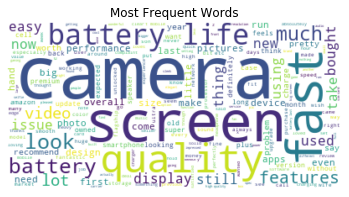

In [56]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','really','price','best','amazing',
                  'opera','work','product','phones','awesome','day','will','feature','far','works','beautiful','better','everything','time','well','picture','buy','app','android','feel'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.7.3) Negative Analysis

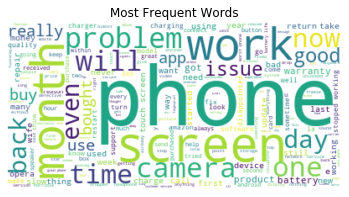

In [57]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in Sony_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

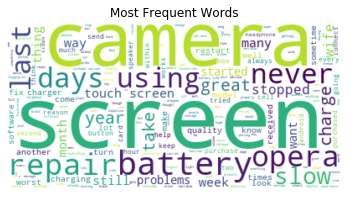

In [58]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','months','problem','work','time','now','will','good','day',
                  'phones','buy','really','app','issue','bought','back','bad','product','call','first','apps','la','es','us','en',
                  'device','price','new','warranty','amazon','used','china','need','disappointed','say','working','issues','go','support','calls','return','mobile','able','lo','case','update','con','money'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.7.4) Phone Model

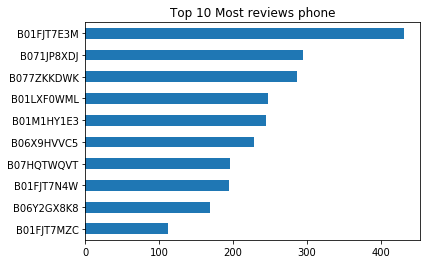

In [59]:
Sony_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.8) HUAWEI

#### 4.2.8.1) General Analysis

In [60]:
HUAWEI_df['Sentiment'].value_counts()

positive    1223
mixed        499
negative     321
neutral      144
Name: Sentiment, dtype: int64

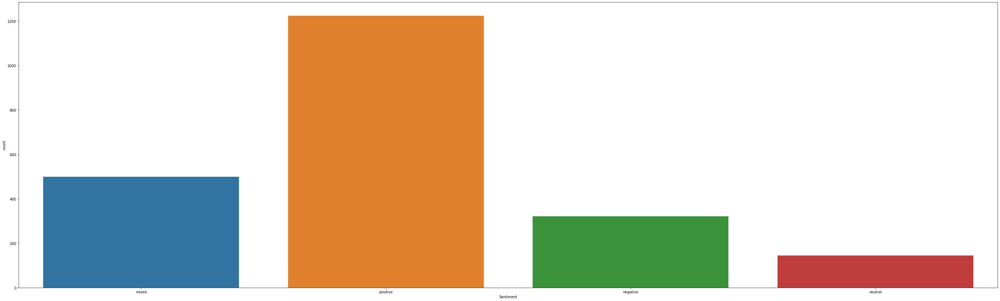

In [61]:
plt.figure(figsize=(50,15))
sns.countplot(HUAWEI_df['Sentiment'])

In [59]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

HUAWEI_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [60]:
HUAWEI_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [64]:
HUAWEI_pos_df=HUAWEI_df.loc[HUAWEI_df['Sentiment'] == 'positive']
HUAWEI_neg_df=HUAWEI_df.loc[HUAWEI_df['Sentiment'] == 'negative']

#### 4.2.8.2) Positive Analysis

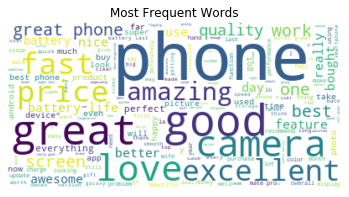

In [65]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in HUAWEI_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

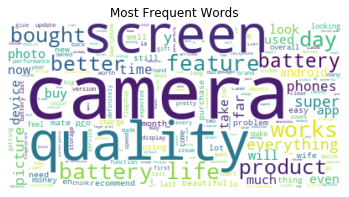

In [66]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','best','fast','price','amazing','work','really','awesome'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.8.3) Negative Analysis

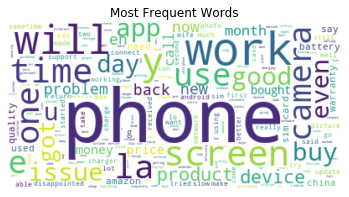

In [67]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in HUAWEI_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

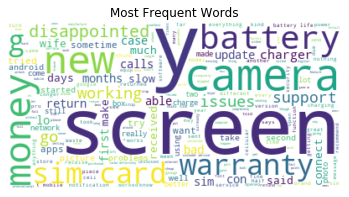

In [68]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','will','time','work','la','buy','good','es','day','app',
                  'issue','phones','product','back','call','problem','month','now','us','price','en','bought',
                  'quality','device','amazon','china','used','say','need'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.8.4) Phone Model

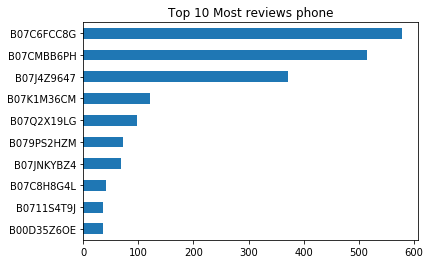

In [69]:
HUAWEI_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.9) OnePlus

#### 4.2.9.1) General Analysis

In [70]:
OnePlus_df['Sentiment'].value_counts()

positive    155
mixed       117
negative     57
neutral      17
Name: Sentiment, dtype: int64

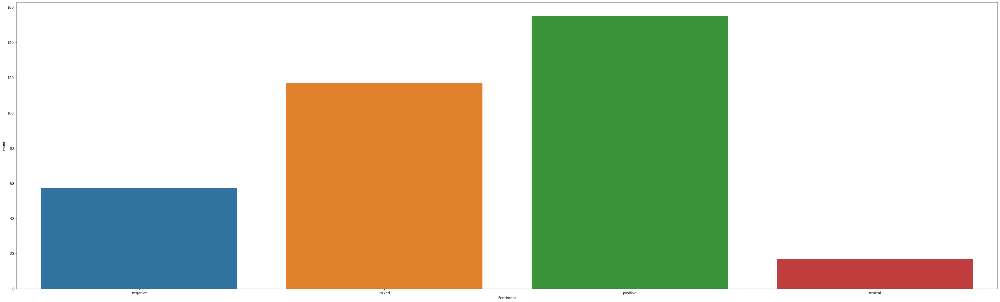

In [71]:
plt.figure(figsize=(50,15))
sns.countplot(OnePlus_df['Sentiment'])

In [61]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

OnePlus_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [62]:
OnePlus_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [74]:
OnePlus_pos_df=OnePlus_df.loc[OnePlus_df['Sentiment'] == 'positive']
OnePlus_neg_df=OnePlus_df.loc[OnePlus_df['Sentiment'] == 'negative']

#### 4.2.9.2) Positive Analysis

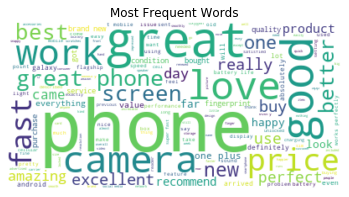

In [75]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in OnePlus_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

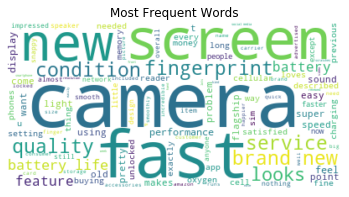

In [76]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','works','price','really',
                  'best','better','amazing','day','buy','came','product','plus','look','recommend','far','everything','mobile','value','bought','purchase','will','arrived','perfectly',
                  'absolutely','definitely','lot','android','even','days','used','box','take','much','say','make','sent','time','issue'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.9.3) Negative Analysis

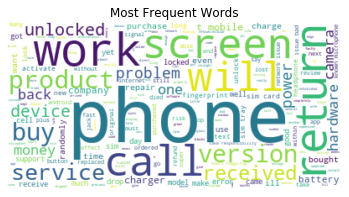

In [77]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in OnePlus_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

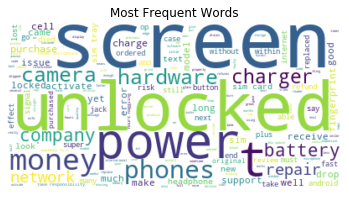

In [78]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','return','work','calls','product','unlock','buy','service','mobile','device','received','version',
                  'problem','back','want','bad','time','bought','will','ill','randomly','day'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.9.4) Phone Model

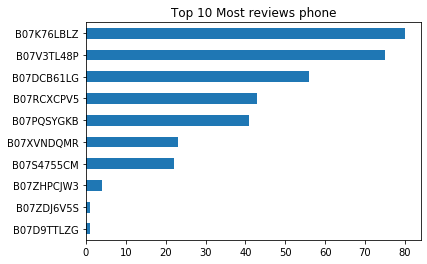

In [79]:
OnePlus_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Top 10 Most reviews phone")
plt.show()

### 4.2.10) ASUS

#### 4.2.10.1) General Analysis

In [80]:
ASUS_df['Sentiment'].value_counts()

positive    105
mixed        88
negative     46
neutral      11
Name: Sentiment, dtype: int64

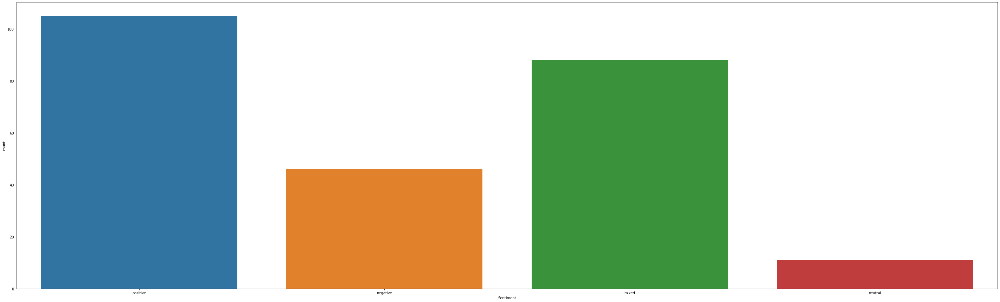

In [81]:
plt.figure(figsize=(50,15))
sns.countplot(ASUS_df['Sentiment'])

In [63]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

ASUS_df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

In [64]:
ASUS_df['cust_rating'].iplot(
    kind='hist',
    xTitle='customer ratings',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

In [84]:
ASUS_pos_df=ASUS_df.loc[ASUS_df['Sentiment'] == 'positive']
ASUS_neg_df=ASUS_df.loc[ASUS_df['Sentiment'] == 'negative']

#### 4.2.10.2) Positive Analysis

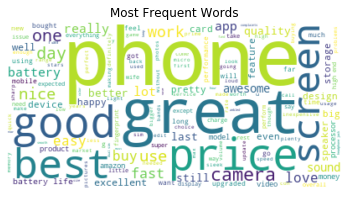

In [85]:
# positive review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in ASUS_pos_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

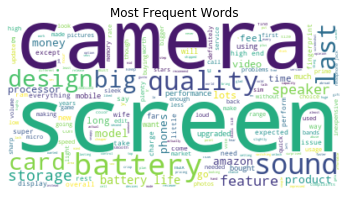

In [86]:
stopwords = set(STOPWORDS)
stopwords.update(["phone", "good", "great", "love", 
                  "perfect", "excellent", "happy", "nice", "galaxy","got","use",'thank','one','price','best','works','day','fast','buy','easy',
                  'really','lot','apps','awesome','better','still','well','even','device','days','pretty'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.10.3) Negative Analysis

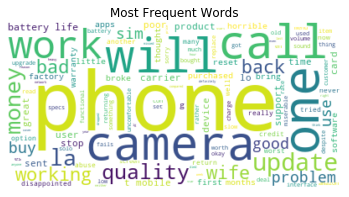

In [87]:
# negative review
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(reviews for reviews in ASUS_neg_df.review)

# Create and generate a word cloud image:
wordcloud = WordCloud( background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

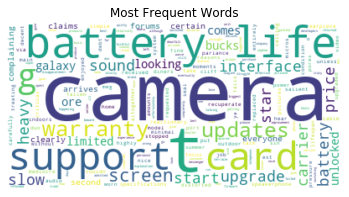

In [88]:
stopwords = set(STOPWORDS)
stopwords.update(["phone","one","even",'use','got','will','call','update','work','la','money','calls','working','back','bad','quality',
                  'wife','problem','sim','mobile','buy','good','product','user','lo','poor','stop','sent','great','broke','device',
                  'time','horrible','purchased','months','first','apps','reset','factory','bring','little','really','worst','disappointed',
                  'abuse','thought','works','many','another','return','now','credit','option','tried','well','never','old','software','solo',
                  'options','specs','en','functional','item','con','es','set','despite','uncomfortable','charge','returning',
                  'bought','carriers','replace','much','menu','read','thing','worth','rather','deal','fails','amazon','used','okay','something','customer','miserable',
                  'low','rate','volume','sorry','dropped','definitely','times','week','last','year','died','neither','cover','lg','right','network','missed','think',
                  'anyone','reason','compared','hour'])
# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Frequent Words')
plt.axis("off")
plt.show()

#### 4.2.10.4) Phone Model

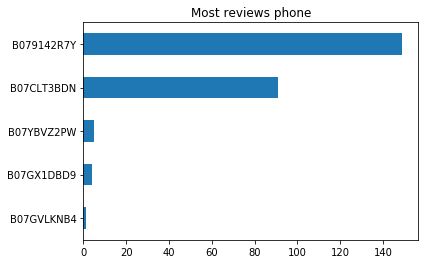

In [89]:
ASUS_df["model_no"].value_counts().sort_values(ascending=True).tail(10).plot(kind="barh")
plt.title("Most reviews phone")
plt.show()